In [110]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
df = pd.read_csv('final_internship_data.csv')

In [140]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 26 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   User ID            500000 non-null  object 
 1   User Name          500000 non-null  object 
 2   Driver Name        500000 non-null  object 
 3   Car Condition      500000 non-null  object 
 4   Weather            500000 non-null  object 
 5   Traffic Condition  500000 non-null  object 
 6   key                500000 non-null  object 
 7   fare_amount        500000 non-null  float64
 8   pickup_datetime    500000 non-null  object 
 9   pickup_longitude   500000 non-null  float64
 10  pickup_latitude    500000 non-null  float64
 11  dropoff_longitude  499995 non-null  float64
 12  dropoff_latitude   499995 non-null  float64
 13  passenger_count    500000 non-null  int64  
 14  hour               500000 non-null  int64  
 15  day                500000 non-null  int64  
 16  mo

In [112]:
for col in df[['Car Condition','Weather','Traffic Condition']]:
    values = pd.DataFrame(df[col].value_counts())
    print(f"Value counts for column {col}:\n{values}\n")

Value counts for column Car Condition:
                count
Car Condition        
Very Good      125312
Bad            124978
Good           124968
Excellent      124742

Value counts for column Weather:
          count
Weather        
sunny    100433
cloudy   100062
rainy     99972
stormy    99955
windy     99578

Value counts for column Traffic Condition:
                    count
Traffic Condition        
Congested Traffic  166847
Dense Traffic      166584
Flow Traffic       166569



In [113]:
# Check for duplicate rows
duplicate_count = df.duplicated().sum()

# Summary statistics for numerical columns
numerical_summary = df.describe()

# Check unique values for categorical columns
categorical_columns = ["Car Condition", "Weather", "Traffic Condition"]
categorical_unique_values = {col: df[col].unique() for col in categorical_columns}


In [114]:
numerical_summary

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
count,500000.000000,500000.000000,500000.000000,499995.000000,499995.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000
mean,11.358361,-1.265712,0.696740,-1.265755,0.696675,1.683428,13.510834,15.684206,6.268650,3.042008,2011.739132,385.279367,380.503657,363.843772,363.674038,355.991423,19.468775,0.297145
std,9.916617,0.206941,0.140909,0.205903,0.128997,1.307395,6.511571,8.681066,3.437815,1.949240,1.860889,2419.087483,2428.804740,2425.075903,2428.348683,2428.730839,367.299601,1.804548
min,-44.900000,-52.119764,-54.389440,-59.049665,-44.676047,0.000000,0.000000,1.000000,1.000000,0.000000,2009.000000,1.017646,1.460945,0.382119,0.532545,0.080500,0.000000,-3.141593
25%,6.000000,-1.291405,0.710958,-1.291393,0.710943,1.000000,9.000000,8.000000,3.000000,1.000000,2010.000000,41.341514,32.173712,17.100762,14.886989,7.147384,1.214550,-0.854721
50%,8.500000,-1.291226,0.711268,-1.291197,0.711277,1.000000,14.000000,16.000000,6.000000,3.000000,2012.000000,42.523163,34.787507,19.591554,18.347580,10.458151,2.116970,-0.050442
75%,12.500000,-1.290970,0.711520,-1.290908,0.711538,2.000000,19.000000,23.000000,9.000000,5.000000,2013.000000,43.785649,38.304502,22.214815,22.417812,14.448699,3.890070,2.206769
max,500.000000,37.360538,29.724576,0.712985,7.061893,6.000000,23.000000,31.000000,12.000000,6.000000,2015.000000,30133.067880,30167.595967,30167.285794,30159.407296,30162.285356,12399.956433,3.141593


In [115]:
categorical_unique_values

{'Car Condition': array(['Very Good', 'Excellent', 'Bad', 'Good'], dtype=object),
 'Weather': array(['windy', 'cloudy', 'stormy', 'sunny', 'rainy'], dtype=object),
 'Traffic Condition': array(['Congested Traffic', 'Flow Traffic', 'Dense Traffic'], dtype=object)}

# Data Cleaning

In [116]:
# Remove negative fares
df_cleaned = df[df['fare_amount'] >= 0]

# Drop rows with missing values (since they are very few)
df_cleaned = df.dropna()

# Drop unnecessary columns
columns_to_drop = ["User ID", "User Name", "Driver Name", "key"]
df_cleaned = df.drop(columns=columns_to_drop)

# Convert 'pickup_datetime' to datetime type
df_cleaned["pickup_datetime"] = pd.to_datetime(df_cleaned["pickup_datetime"],errors='coerce')

# Remove unrealistic distances (e.g., greater than 100 km)
df_cleaned = df_cleaned[df_cleaned['distance'] <= 100]
df_cleaned.columns = df_cleaned.columns.str.replace(' ','_',regex=True)
df_cleaned.columns = df_cleaned.columns.str.lower()

# Extract new time-based features
# Extract hour and convert to 12-hour format with AM/PM 
# Formats hour as 12-hour AM/PM
df_cleaned["pickup_weekday"] = df_cleaned["pickup_datetime"].dt.day_name()
df_cleaned["pickup_hour_12"] = df_cleaned["pickup_datetime"].dt.strftime("%I %p")  
df_cleaned["pickup_month"] = df_cleaned["pickup_datetime"].dt.month_name()
df_cleaned["pickup_year"] = df_cleaned["pickup_datetime"].dt.year

# Drop the original 'pickup_datetime' column since we extracted useful features
df_cleaned = df_cleaned.drop(columns=["pickup_datetime"])

# Check new shape after cleaning
df_cleaned.shape


(498903, 25)

In [117]:
# Drop redundant time-based columns
columns_to_remove = ["hour", "day", "month", "year","weekday"]

# Drop unnecessary distance columns, keeping only 'distance' as a general feature
distance_cols_to_remove = ["jfk_dist", "ewr_dist", "lga_dist", "sol_dist", "nyc_dist"]

# Remove selected columns
df_cleaned = df_cleaned.drop(columns=columns_to_remove + distance_cols_to_remove)

# Show updated structure
df_cleaned.info()


<class 'pandas.core.frame.DataFrame'>
Index: 498903 entries, 0 to 499999
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   car_condition      498903 non-null  object 
 1   weather            498903 non-null  object 
 2   traffic_condition  498903 non-null  object 
 3   fare_amount        498903 non-null  float64
 4   pickup_longitude   498903 non-null  float64
 5   pickup_latitude    498903 non-null  float64
 6   dropoff_longitude  498903 non-null  float64
 7   dropoff_latitude   498903 non-null  float64
 8   passenger_count    498903 non-null  int64  
 9   distance           498903 non-null  float64
 10  bearing            498903 non-null  float64
 11  pickup_weekday     498903 non-null  object 
 12  pickup_hour_12     498903 non-null  object 
 13  pickup_month       498903 non-null  object 
 14  pickup_year        498903 non-null  int32  
dtypes: float64(7), int32(1), int64(1), object(6)
memory usag

In [118]:
# Split our data 
num = df_cleaned.select_dtypes('number')
cat = df_cleaned.select_dtypes('object')

In [119]:
num.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,bearing,pickup_year
count,498903.000000,498903.000000,498903.000000,498903.000000,498903.000000,498903.000000,498903.000000,498903.000000,498903.000000
mean,11.348059,-1.266713,0.697376,-1.266696,0.697370,1.683415,3.270999,0.298638,2011.737244
std,9.866036,0.177795,0.105026,0.177794,0.104647,1.307182,3.734461,1.804986,1.860957
min,-44.900000,-2.118676,-1.291826,-2.118677,-1.292158,0.000000,0.000000,-3.141550,2009.000000
25%,6.000000,-1.291405,0.710960,-1.291393,0.710945,1.000000,1.212992,-0.851980,2010.000000
50%,8.500000,-1.291226,0.711269,-1.291197,0.711277,1.000000,2.112326,-0.050452,2012.000000
75%,12.500000,-1.290971,0.711520,-1.290909,0.711538,2.000000,3.870012,2.209939,2013.000000
max,500.000000,0.712319,7.000225,0.712985,0.757738,6.000000,99.876304,3.141593,2015.000000


In [120]:
cat.describe()

,car_condition,weather,traffic_condition,pickup_weekday,pickup_hour_12,pickup_month
count,498903,498903,498903,498903,498903,498903
unique,4,5,3,7,24,12
top,Very Good,sunny,Congested Traffic,Friday,07 PM,May
freq,125022,100195,166476,77063,31327,46619


In [121]:
df_cleaned.head()

,car_condition,weather,traffic_condition,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,bearing,pickup_weekday,pickup_hour_12,pickup_month,pickup_year
0,Very Good,windy,Congested Traffic,4.5,-1.288826,0.710721,-1.288779,0.710563,1,1.030764,-2.918897,Monday,05 PM,June,2009
1,Excellent,cloudy,Flow Traffic,16.9,-1.291824,0.710546,-1.291182,0.711780,1,8.450134,-0.375217,Tuesday,04 PM,January,2010
2,Bad,stormy,Congested Traffic,5.7,-1.291242,0.711418,-1.291391,0.711231,2,1.389525,2.599961,Thursday,12 AM,August,2011
3,Very Good,stormy,Flow Traffic,7.7,-1.291319,0.710927,-1.291396,0.711363,1,2.799270,0.133905,Saturday,04 AM,April,2012
4,Bad,stormy,Congested Traffic,5.3,-1.290987,0.711536,-1.290787,0.711811,1,1.999157,-0.502703,Tuesday,07 AM,March,2010


# Visualise  

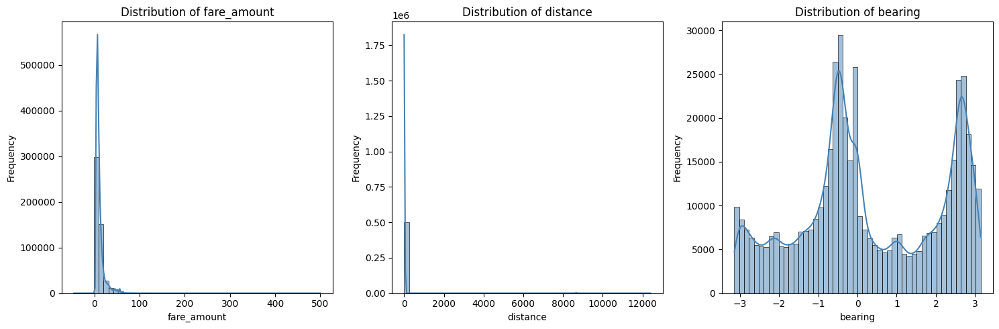

In [13]:
# Define numerical columns
numerical_cols = ["fare_amount", "distance", "bearing"]

# Set up the figure
plt.figure(figsize=(15, 5))

# Plot histograms for numerical columns
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(1, 3, i)
    sns.histplot(df[col], bins=50, kde=True, color="steelblue")
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


In [14]:
df.columns

Index(['User ID', 'User Name', 'Driver Name', 'Car Condition', 'Weather',
       'Traffic Condition', 'key', 'fare_amount', 'pickup_datetime',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'passenger_count', 'hour', 'day', 'month',
       'weekday', 'year', 'jfk_dist', 'ewr_dist', 'lga_dist', 'sol_dist',
       'nyc_dist', 'distance', 'bearing'],
      dtype='object')

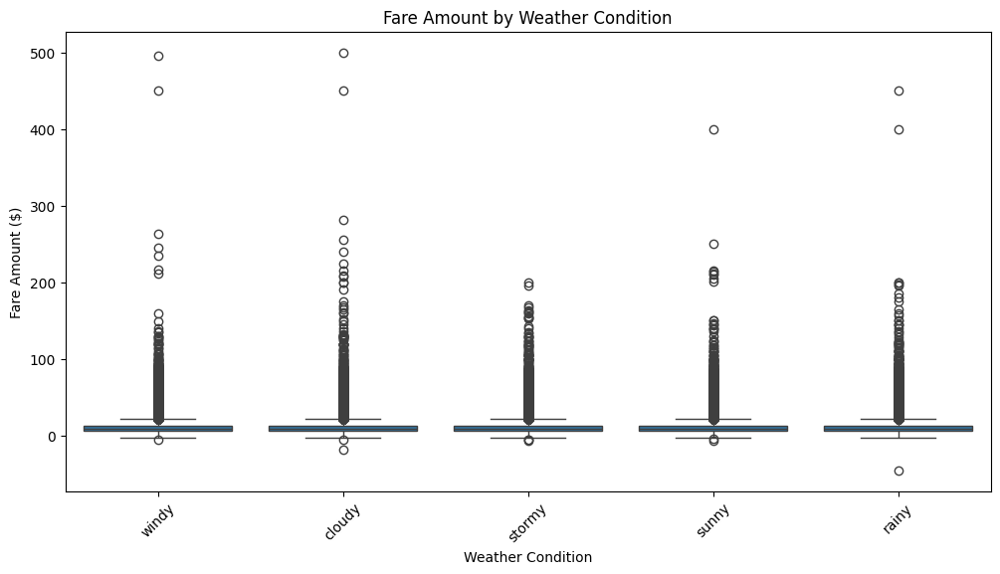

In [15]:
# Boxplot of fare amount by weather condition
plt.figure(figsize=(12, 6))
sns.boxplot(x="Weather", y="fare_amount", data=df)
plt.title("Fare Amount by Weather Condition")
plt.xlabel("Weather Condition")
plt.ylabel("Fare Amount ($)")
plt.xticks(rotation=45)
plt.show()

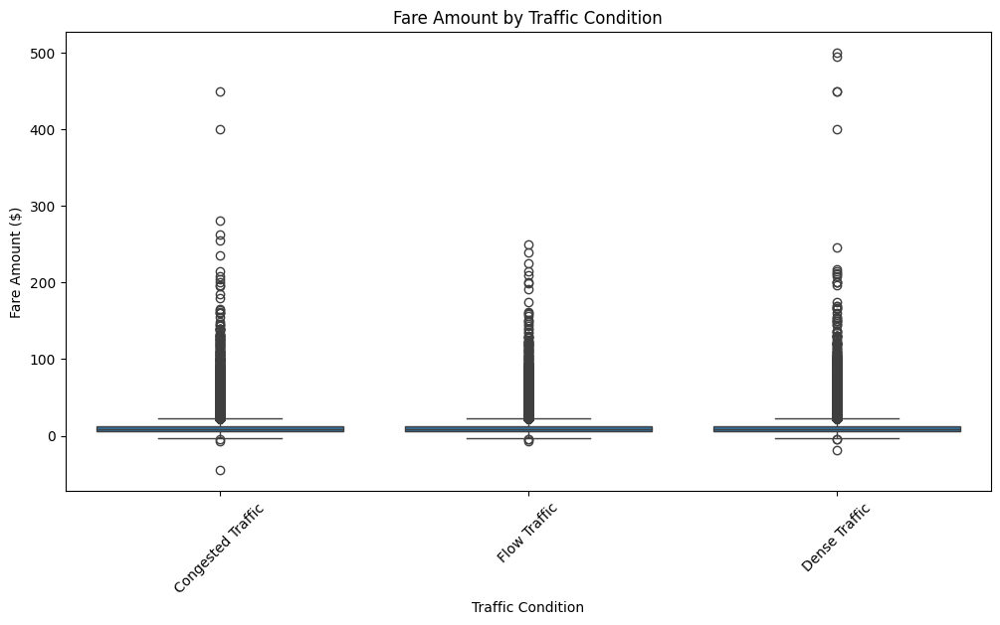

In [16]:
# Boxplot of fare amount by traffic condition
plt.figure(figsize=(12, 6))
sns.boxplot(x="Traffic Condition", y="fare_amount", data=df)
plt.title("Fare Amount by Traffic Condition")
plt.xlabel("Traffic Condition")
plt.ylabel("Fare Amount ($)")
plt.xticks(rotation=45)
plt.show()

In [125]:
def remove_outliers(df, num_cols):
    """
    Removes outliers using the IQR method for multiple numerical columns.
    
    Parameters:
    df (DataFrame): The dataset
    num_cols (list): List of numerical column names
    
    Returns:
    DataFrame: Cleaned dataset without outliers
    """
    for col in num_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    
    return df


In [126]:
# Remove outliers from key numerical columns
df_cleaned = remove_outliers(df_cleaned,num)

# Check new shape after outlier removal
df_cleaned.columns

Index(['car_condition', 'weather', 'traffic_condition', 'fare_amount',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'passenger_count', 'distance', 'bearing',
       'pickup_weekday', 'pickup_hour_12', 'pickup_month', 'pickup_year'],
      dtype='object')

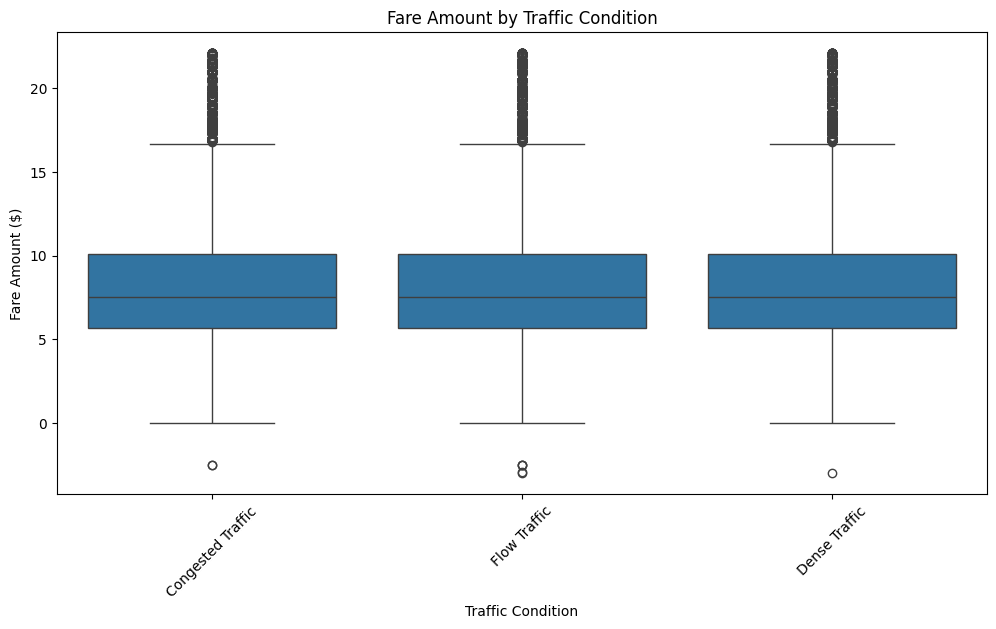

In [19]:
# Boxplot of fare amount by traffic condition
plt.figure(figsize=(12, 6))
sns.boxplot(x="traffic_condition", y="fare_amount", data=df_cleaned)
plt.title("Fare Amount by Traffic Condition")
plt.xlabel("Traffic Condition")
plt.ylabel("Fare Amount ($)")
plt.xticks(rotation=45)
plt.show()

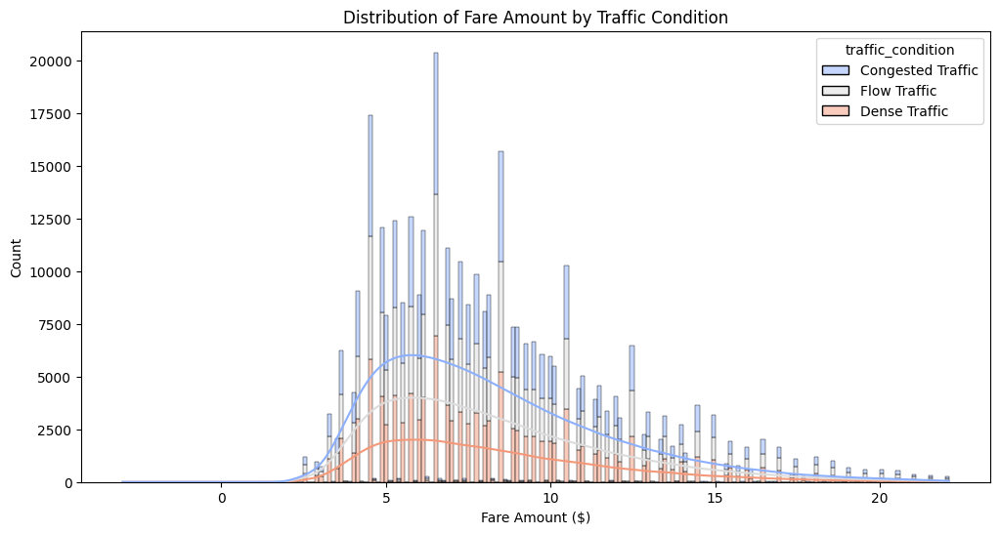

In [20]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df_cleaned, x="fare_amount", hue="traffic_condition", multiple="stack", kde=True, palette="coolwarm")
plt.title("Distribution of Fare Amount by Traffic Condition")
plt.xlabel("Fare Amount ($)")
plt.ylabel("Count")
plt.show()


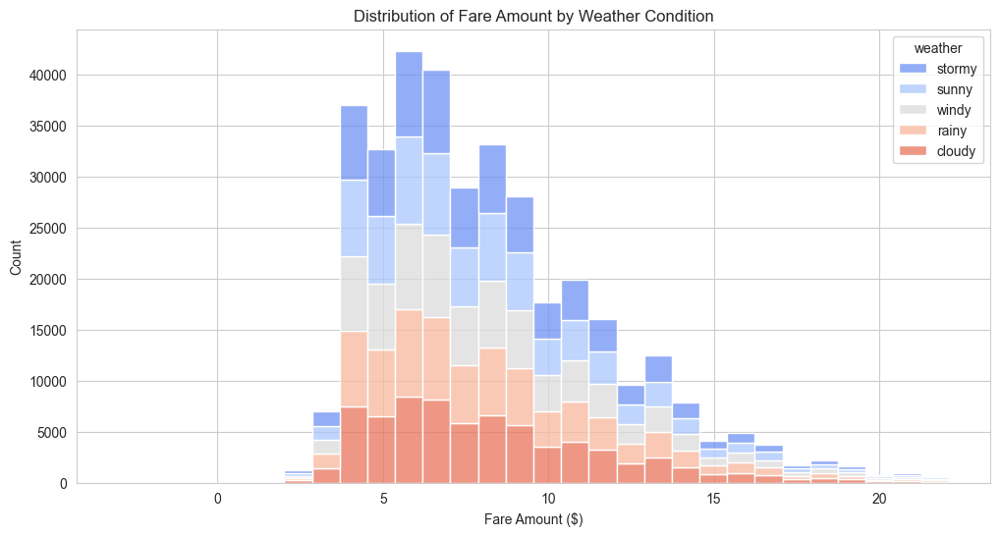

In [142]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df_cleaned, x="fare_amount", hue="weather", multiple="stack", palette="coolwarm", bins=30)
plt.title("Distribution of Fare Amount by Weather Condition")
plt.xlabel("Fare Amount ($)")
plt.ylabel("Count")
plt.show()


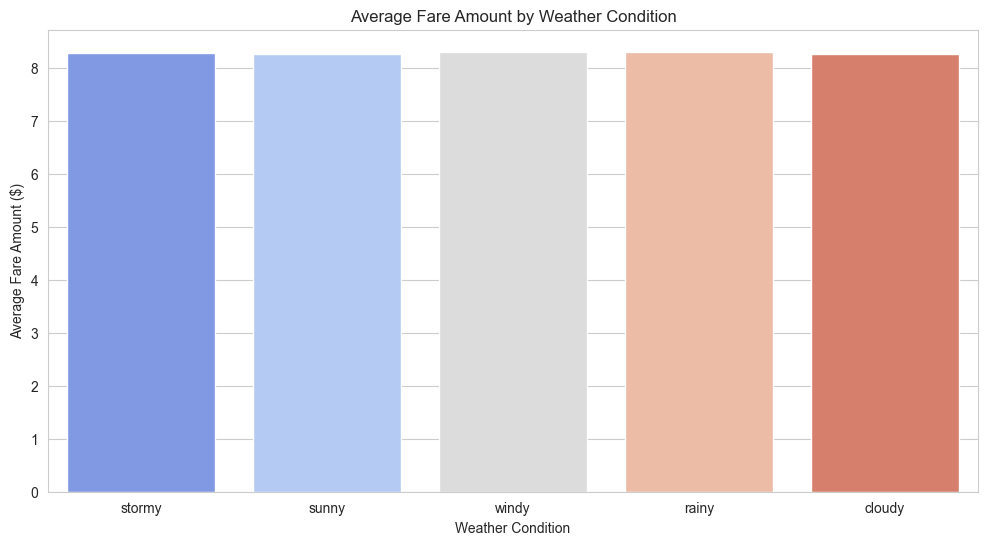

In [143]:
plt.figure(figsize=(12, 6))
sns.barplot(data=df_cleaned, x="weather", y="fare_amount", estimator=np.mean, ci=None, palette="coolwarm")
plt.title("Average Fare Amount by Weather Condition")
plt.xlabel("Weather Condition")
plt.ylabel("Average Fare Amount ($)")
plt.show()


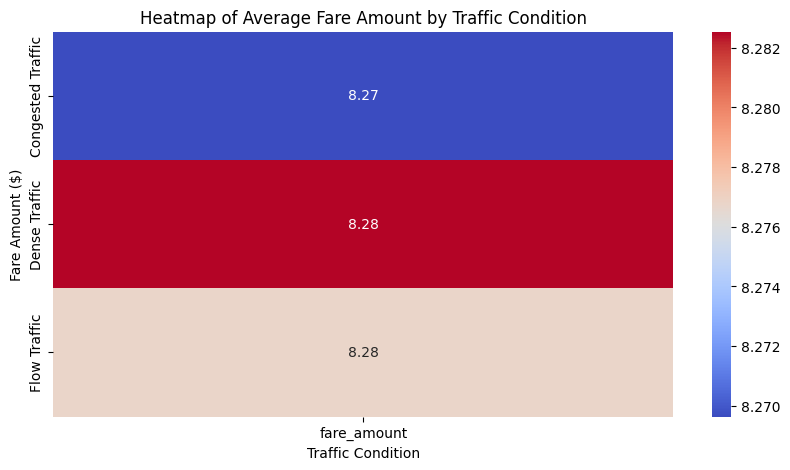

In [21]:
pivot_table = df_cleaned.pivot_table(index="traffic_condition", values="fare_amount", aggfunc="mean")

plt.figure(figsize=(10, 5))
sns.heatmap(pivot_table, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap of Average Fare Amount by Traffic Condition")
plt.xlabel("Traffic Condition")
plt.ylabel("Fare Amount ($)")
plt.show()


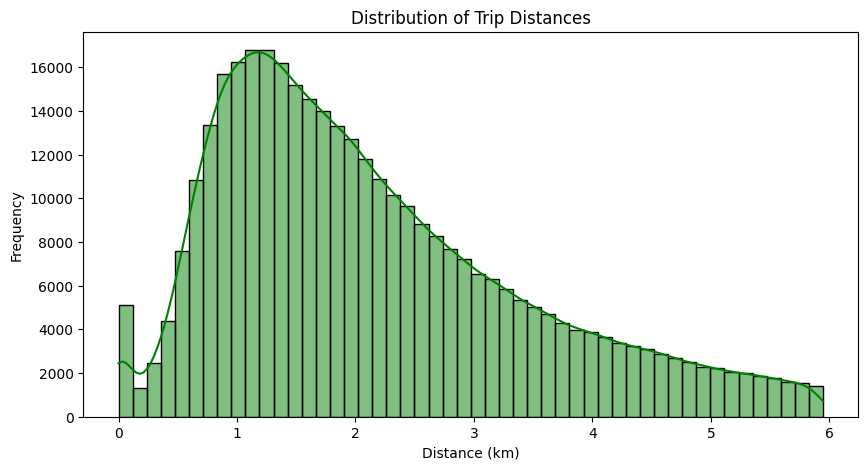

In [22]:
# Plot distribution of trip distances
plt.figure(figsize=(10, 5))
sns.histplot(df_cleaned['distance'], bins=50, kde=True, color='green')
plt.title("Distribution of Trip Distances")
plt.xlabel("Distance (km)")
plt.ylabel("Frequency")
plt.show()

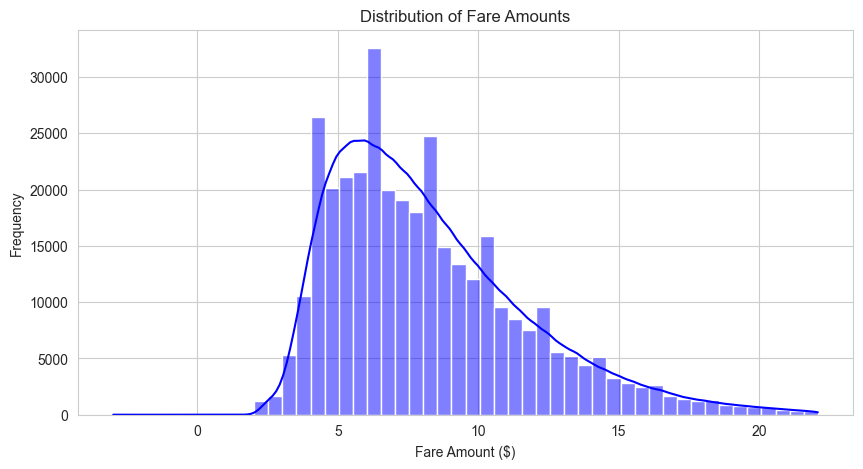

In [23]:
# Set style
sns.set_style("whitegrid")

# Plot distribution of fare amounts
plt.figure(figsize=(10, 5))
sns.histplot(df_cleaned['fare_amount'], bins=50, kde=True, color='blue')
plt.title("Distribution of Fare Amounts")
plt.xlabel("Fare Amount ($)")
plt.ylabel("Frequency")
plt.show()


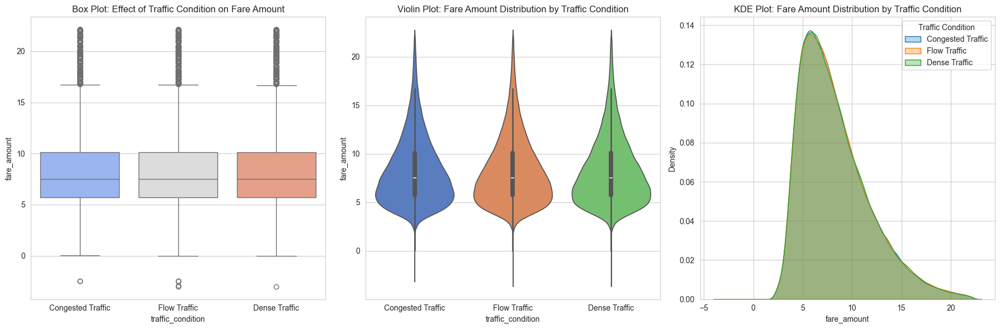

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Box Plot: Effect of Traffic Condition on Fare Amount
sns.boxplot(data=df_cleaned, x="traffic_condition", y="fare_amount", palette="coolwarm", ax=axes[0])
axes[0].set_title("Box Plot: Effect of Traffic Condition on Fare Amount")

# Violin Plot: Fare Amount Distribution by Traffic Condition
sns.violinplot(data=df_cleaned, x="traffic_condition", y="fare_amount", palette="muted", ax=axes[1])
axes[1].set_title("Violin Plot: Fare Amount Distribution by Traffic Condition")

# KDE (Density Plot): Fare Amount Distribution by Traffic Condition
for condition in df_cleaned["traffic_condition"].unique():
    subset = df_cleaned[df_cleaned["traffic_condition"] == condition]
    sns.kdeplot(data=subset, x="fare_amount", label=condition, fill=True, alpha=0.3, ax=axes[2])
axes[2].set_title("KDE Plot: Fare Amount Distribution by Traffic Condition")
axes[2].legend(title="Traffic Condition")

# Adjust layout and save the figure
plt.tight_layout()
plt.show()


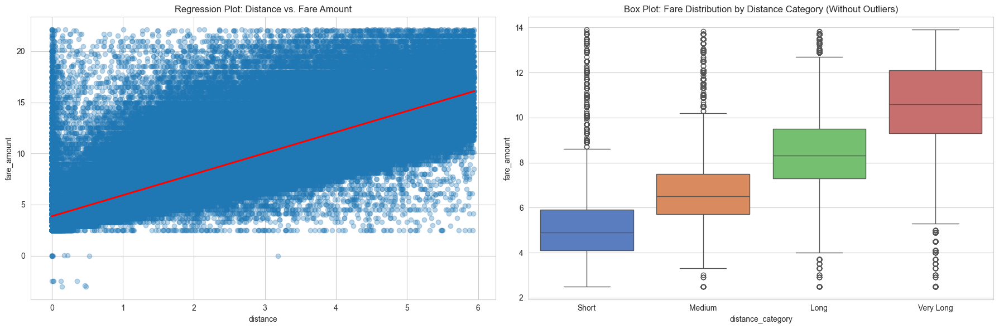

In [25]:
# Create a figure with 3 subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Regression Plot: Distance vs. Fare Amount with Trend Line
sns.regplot(data=df_cleaned, x="distance", y="fare_amount", scatter_kws={'alpha':0.3}, line_kws={'color':'red'}, ax=axes[0])
axes[0].set_title("Regression Plot: Distance vs. Fare Amount")

# Create distance categories
df_cleaned["distance_category"] = pd.qcut(df_cleaned["distance"], q=4, labels=["Short", "Medium", "Long", "Very Long"])

# Calculate IQR to remove outliers
Q1 = df_cleaned["fare_amount"].quantile(0.25)
Q3 = df_cleaned["fare_amount"].quantile(0.65)
IQR = Q3 - Q1

# Define lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out outliers
df_filtered = df_cleaned[(df_cleaned["fare_amount"] >= lower_bound) & (df_cleaned["fare_amount"] <= upper_bound)]

# Box Plot without outliers
sns.boxplot(data=df_filtered, x="distance_category", y="fare_amount", palette="muted", ax=axes[1])
axes[1].set_title("Box Plot: Fare Distribution by Distance Category (Without Outliers)")


# Adjust layout and show plot
plt.tight_layout()
plt.show()

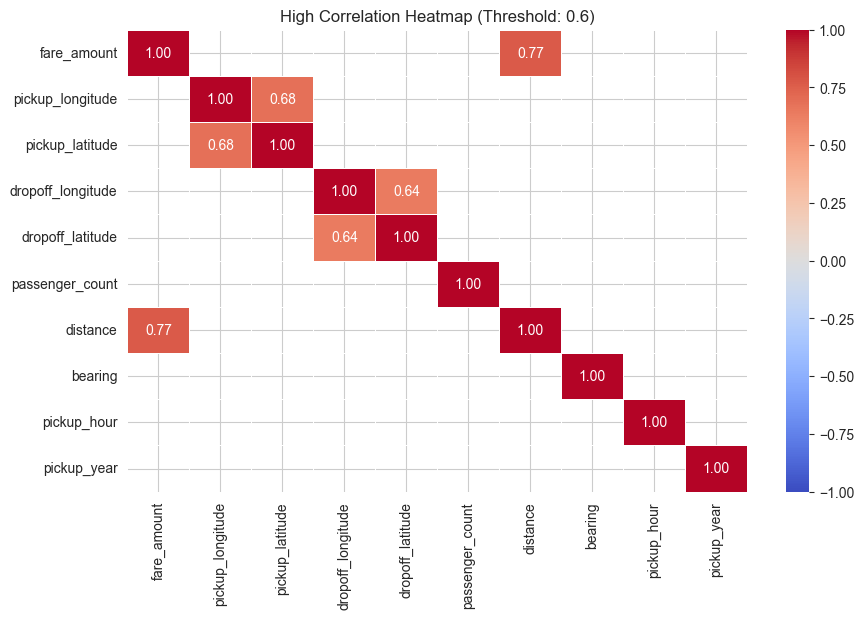

In [28]:
import numpy as np

# Compute correlation matrix
corr_matrix = df_cleaned.corr(numeric_only=True)

# Set correlation threshold (e.g., 0.6 for strong correlations)
threshold = 0.6

# Select only strong correlations
high_corr = corr_matrix[(corr_matrix >= threshold) | (corr_matrix <= -threshold)]

# Heatmap for high correlations only
plt.figure(figsize=(10, 6))
sns.heatmap(high_corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5, vmin=-1, vmax=1)
plt.title("High Correlation Heatmap (Threshold: 0.6)")
plt.show()


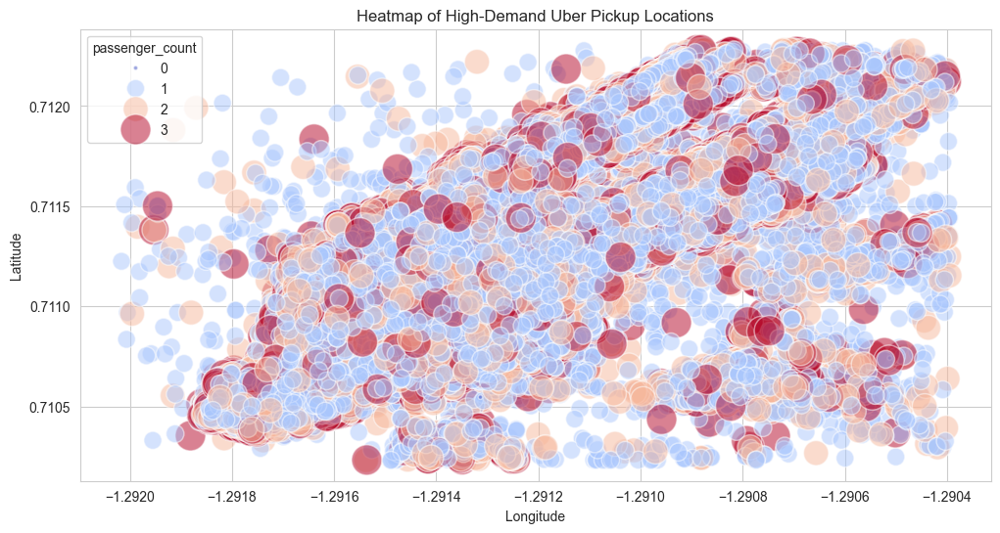

In [65]:
# Scatterplot on Matplotlib
plt.figure(figsize=(12,6))
sns.scatterplot(
    x=df_cleaned['pickup_longitude'], 
    y=df_cleaned['pickup_latitude'], 
    size=df_cleaned['passenger_count'], 
    sizes=(10, 500), 
    alpha=0.5, 
    hue=df_cleaned['passenger_count'], 
    palette='coolwarm'
)
plt.title("Heatmap of High-Demand Uber Pickup Locations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


In [68]:
# Group by pickup location and count rides
top_locations = df_cleaned.groupby(['pickup_latitude', 'pickup_longitude']).size().reset_index(name='ride_count')

# Check if 'ride_count' exists
print(top_locations.head())  # Debugging step


   pickup_latitude  pickup_longitude  ride_count
0         0.710231         -1.291489           1
1         0.710231         -1.291040           1
2         0.710231         -1.290980           1
3         0.710231         -1.290774           1
4         0.710231         -1.291538           1


In [144]:
import folium
from folium.plugins import HeatMap, Fullscreen
import requests

# Load country borders (GeoJSON)
geojson_url = "https://raw.githubusercontent.com/johan/world.geo.json/master/countries.geo.json"
geojson_data = requests.get(geojson_url).json()

# Create Leaflet-based Folium map (centered globally)
m = folium.Map(
    location=[20, 0],  # Centering around the world
    zoom_start=2,  # Zoomed out for full world view
    tiles="cartodbpositron"  # Clean and minimal Leaflet-based map
)

# Add heatmap layer (Uber pickup density)
HeatMap(
    data=top_locations[['pickup_latitude', 'pickup_longitude', 'ride_count']].values, 
    radius=12, 
    blur=15, 
    max_zoom=1
).add_to(m)

# Add country borders using Leaflet's GeoJSON layer
folium.GeoJson(
    geojson_data,
    name="Country Borders",
    style_function=lambda x: {"color": "black", "weight": 1, "fillOpacity": 0.1}  # Light transparency
).add_to(m)

# Enable full-screen mode (Leaflet plugin)
Fullscreen(position="topright").add_to(m)

# Fit map bounds to show all pickup locations
m.fit_bounds([[top_locations["pickup_latitude"].min(), top_locations["pickup_longitude"].min()], 
              [top_locations["pickup_latitude"].max(), top_locations["pickup_longitude"].max()]])

# Save and display
m.save("leaflet_uber_map.html")
m  # Displays the map in Jupyter Notebook


# Timeseris Visualise

In [134]:
df_cleaned.columns

Index(['car_condition', 'weather', 'traffic_condition', 'fare_amount',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'passenger_count', 'distance', 'bearing',
       'pickup_weekday', 'pickup_hour_12', 'pickup_month', 'pickup_year'],
      dtype='object')

Text(0, 0.5, 'Fare Amount ($)')

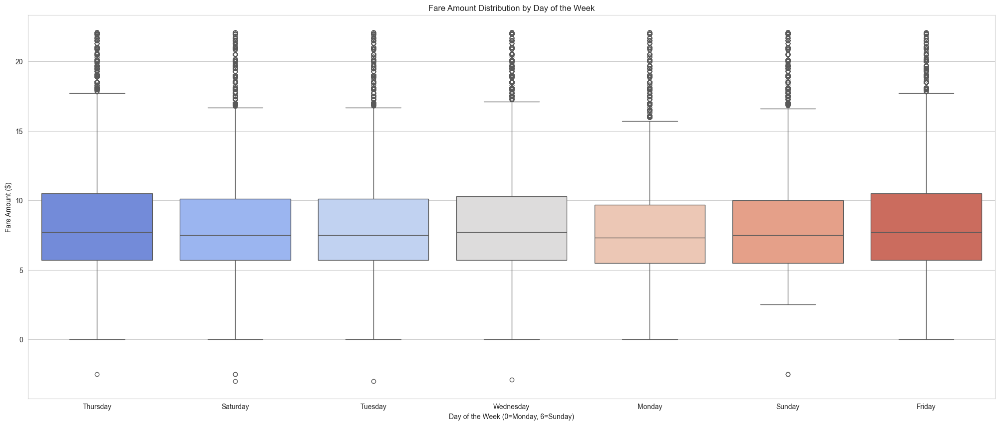

In [128]:
# Set figure size
plt.figure(figsize=(25, 10))

# 2. Box Plot: Fare Amount by Day of the Week
sns.boxplot(x=df_cleaned["pickup_weekday"], y=df_cleaned["fare_amount"], palette="coolwarm")
plt.title("Fare Amount Distribution by Day of the Week")
plt.xlabel("Day of the Week (0=Monday, 6=Sunday)")
plt.ylabel("Fare Amount ($)")


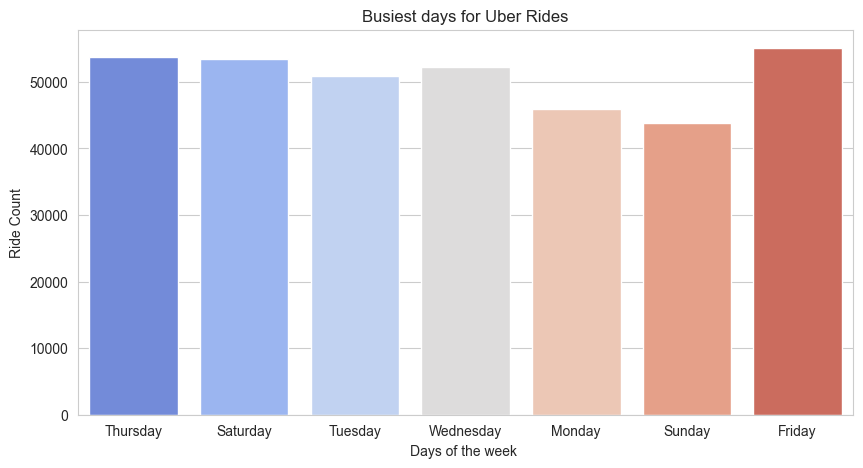

In [76]:
# 1. Busiest day for Uber Rides
plt.figure(figsize=(10,5))
sns.countplot(x='pickup_weekday', data=df_cleaned, palette='coolwarm')
plt.title('Busiest days for Uber Rides')
plt.xlabel('Days of the week ')
plt.ylabel('Ride Count')
plt.show()

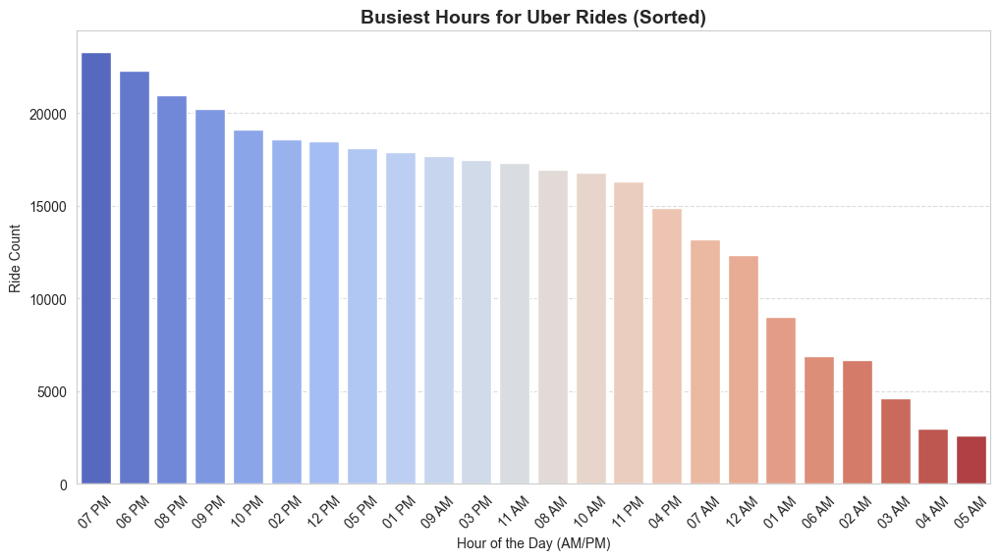

In [133]:
# Count rides per hour and sort in descending order
hour_counts = df_cleaned["pickup_hour_12"].value_counts().reset_index()
hour_counts.columns = ["pickup_hour_12", "ride_count"]
hour_counts = hour_counts.sort_values("ride_count", ascending=False)  # Sort by busiest hours

# Plot sorted busiest hours
plt.figure(figsize=(12, 6))
sns.countplot(
    x="pickup_hour_12", 
    data=df_cleaned, 
    palette="coolwarm", 
    order=hour_counts["pickup_hour_12"]  # Apply sorted order
)

# Improve visualization
plt.title("Busiest Hours for Uber Rides (Sorted)", fontsize=14, fontweight="bold")
plt.xlabel("Hour of the Day (AM/PM)")
plt.ylabel("Ride Count")
plt.xticks(rotation=45)  # Rotate for better readability
plt.grid(axis="y", linestyle="--", alpha=0.7)  # Add a light grid

plt.show()

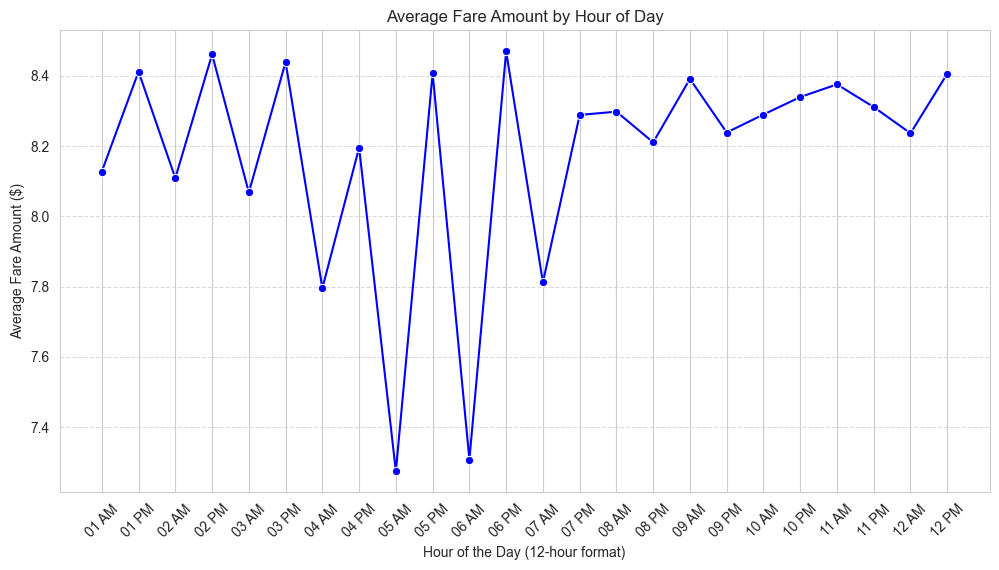

In [139]:
# Group by pickup hour and calculate the average fare amount
hourly_fare = df_cleaned.groupby("pickup_hour_12")["fare_amount"].mean().reset_index()

# Sort values by hour
hourly_fare = hourly_fare.sort_values(by="pickup_hour_12")

# Plot
plt.figure(figsize=(12, 6))
sns.lineplot(x="pickup_hour_12", y="fare_amount", data=hourly_fare, marker='o', color='blue')

plt.title("Average Fare Amount by Hour of Day")
plt.xlabel("Hour of the Day (12-hour format)")
plt.ylabel("Average Fare Amount ($)")
plt.xticks(sorted(hourly_fare["pickup_hour_12"].unique()), rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)  # Add a light grid
plt.show()


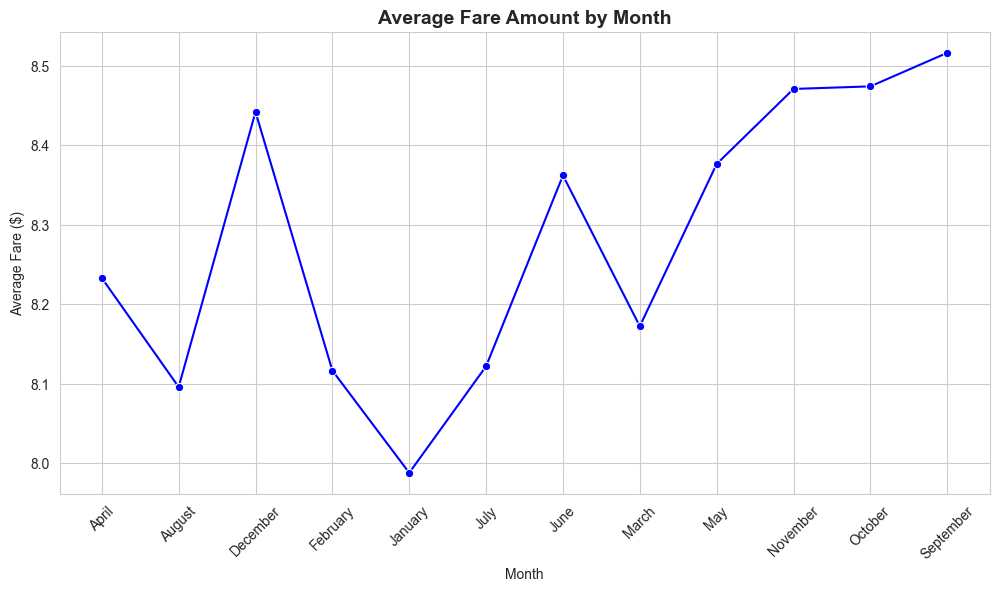

In [86]:
# Group by month and calculate average fare
monthly_fare = df_cleaned.groupby('pickup_month')["fare_amount"].mean().reset_index()


# Plot line chart
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_fare, x="pickup_month", y="fare_amount", marker="o", color="blue")
plt.title("Average Fare Amount by Month", fontsize=14, fontweight="bold")
plt.xlabel("Month")
plt.ylabel("Average Fare ($)")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()